In [1]:
%matplotlib inline
import xarray as xr
import numpy as np
import pandas as pd
import hvplot.xarray
import panel as pn
import panel.widgets as pnw

In [2]:
frequency = pn.widgets.Select(value="D", options=["D", "W", "M"], name="Sampling Frequency")
window = pn.widgets.IntSlider(value=50, start=10, end=100, name="Rolling Window Length")
center = pn.widgets.Checkbox(value=True, name="Center")
win_type = pn.widgets.Select(value="gaussian", options=[None, "gaussian"], name="Window Type")
std = pn.widgets.IntSlider(value=10, start=5, end=20, name="std")
line_width = pn.widgets.IntSlider(value=6, start=1, end=20, name="Line Width")
slider = pnw.IntSlider(name='time', start=0, end=100)

In [3]:
aet = xr.open_dataset('../output/central_sands_actual_et__2012-01-01_to_2013-12-31__346_by_400.nc')
aet_df = aet.to_dataframe

In [41]:
nmin=0
nmax=len(aet.time.values)
slider = pnw.IntSlider(name='time', start=nmin, end=nmax)
aet_mon.hvplot(groupby='time', height=550, widget_type='scrubber', widget_location='bottom', clim=(0,9))

Column
    [0] HoloViews(DynamicMap, widget_location='bottom', widget_type='scrubber')
    [1] Row
        [0] HSpacer()
        [1] WidgetBox
            [0] Player(end=23, width=550)
        [2] HSpacer()

In [4]:
aet_mon = aet.resample(time='M').sum()

In [20]:
aet_mon.hvplot(groupby='time', height=550, widget_type='scrubber', widget_location='bottom', clim=(0,9))

Column
    [0] HoloViews(DynamicMap, widget_location='bottom', widget_type='scrubber')
    [1] Row
        [0] HSpacer()
        [1] WidgetBox
            [0] Player(end=23, width=550)
        [2] HSpacer()

In [19]:
aet_mon

<xarray.Dataset>
Dimensions:    (y: 346, x: 400, time: 24)
Coordinates:
  * y          (y) float64 4.633e+05 4.632e+05 4.631e+05 ... 4.323e+05 4.322e+05
  * x          (x) float64 5.453e+05 5.454e+05 5.455e+05 ... 5.812e+05 5.813e+05
    lat        (y, x) float64 44.64 44.64 44.64 44.64 ... 44.36 44.36 44.36
    lon        (y, x) float64 -89.68 -89.68 -89.68 ... -89.23 -89.23 -89.23
  * time       (time) datetime64[ns] 2012-01-31 2012-02-29 ... 2013-12-31
Data variables:
    actual_et  (time, y, x) float32 0.4474 0.4474 0.4474 ... 0.2824 0.2824
    crs        (time) int32 -2147483647 -2147483647 ... -2147483647 -2147483647
Attributes:
    source:              actual_et output from SWB run started on Mar 06 2023...
    executable_version:  version 2.3.1, build 24, Git branch: master, Git com...
    Conventions:         CF-1.6
    history:             Mar 06 2023 12:00:31: Soil-Water-Balance run started.

In [17]:
from bokeh.models.formatters import DatetimeTickFormatter
formatter = DatetimeTickFormatter(months="%m/%Y")
aet_mon.hvplot.violin('actual_et', by='time', width=1200, xformatter=formatter)

:Violin   [time]   (actual_et)

In [21]:
aet.interactive.isel(time=slider).hvplot.quadmesh('x','y',height=550)

In [20]:
aet_mon.time.dt.month

<xarray.DataArray 'month' (time: 24)>
array([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12,  1,  2,  3,  4,  5,
        6,  7,  8,  9, 10, 11, 12], dtype=int64)
Coordinates:
  * time     (time) datetime64[ns] 2012-01-31 2012-02-29 ... 2013-12-31

In [ ]:
june_aet = aet.actual_et.sel(time=slice('2012-07-01','2012-07-31')).sum(dim='time')

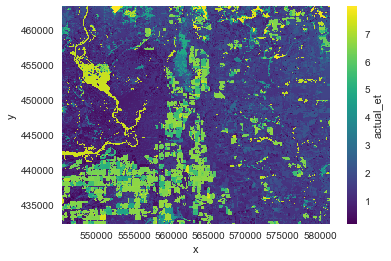

In [ ]:
june_aet.plot()